In [1]:
!pip install protobuf==3.20.*

   ---------------------------------------- 905.1/905.1 kB 1.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.24.4
    Uninstalling protobuf-4.24.4:
      Successfully uninstalled protobuf-4.24.4


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import tensorflow as tf

In [2]:
datadir = './'

columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)

data.head()

C:\Users\Denys\anaconda3\envs\sdc\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Denys\Downloads\Self Driving\train\IMG\center_2024_04_08_01_43_07_521.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\left_2024_04_08_01_43_07_521.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\right_2024_04_08_01_43_07_521.jpg,0.0,0.000000,0.0,0.000004
1,C:\Users\Denys\Downloads\Self Driving\train\IMG\center_2024_04_08_01_43_07_595.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\left_2024_04_08_01_43_07_595.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\right_2024_04_08_01_43_07_595.jpg,0.0,0.000000,0.0,0.000003
2,C:\Users\Denys\Downloads\Self Driving\train\IMG\center_2024_04_08_01_43_07_670.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\left_2024_04_08_01_43_07_670.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\right_2024_04_08_01_43_07_670.jpg,0.0,0.000000,0.0,0.000015
3,C:\Users\Denys\Downloads\Self Driving\train\IMG\center_2024_04_08_01_43_07_747.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\left_2024_04_08_01_43_07_747.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\right_2024_04_08_01_43_07_747.jpg,0.0,0.037243,0.0,0.046215
4,C:\Users\Denys\Downloads\Self Driving\train\IMG\center_2024_04_08_01_43_07_819.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\left_2024_04_08_01_43_07_819.jpg,C:\Users\Denys\Downloads\Self Driving\train\IMG\right_2024_04_08_01_43_07_819.jpg,0.0,0.282599,0.0,0.178952


In [3]:
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_04_08_01_43_07_521.jpg,left_2024_04_08_01_43_07_521.jpg,right_2024_04_08_01_43_07_521.jpg,0.0,0.000000,0.0,0.000004
1,center_2024_04_08_01_43_07_595.jpg,left_2024_04_08_01_43_07_595.jpg,right_2024_04_08_01_43_07_595.jpg,0.0,0.000000,0.0,0.000003
2,center_2024_04_08_01_43_07_670.jpg,left_2024_04_08_01_43_07_670.jpg,right_2024_04_08_01_43_07_670.jpg,0.0,0.000000,0.0,0.000015
3,center_2024_04_08_01_43_07_747.jpg,left_2024_04_08_01_43_07_747.jpg,right_2024_04_08_01_43_07_747.jpg,0.0,0.037243,0.0,0.046215
4,center_2024_04_08_01_43_07_819.jpg,left_2024_04_08_01_43_07_819.jpg,right_2024_04_08_01_43_07_819.jpg,0.0,0.282599,0.0,0.178952


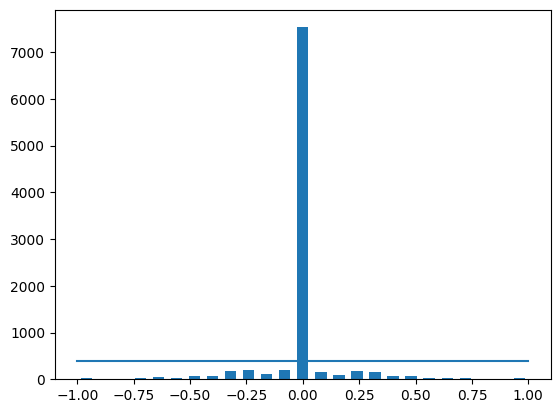

In [4]:
num_bins = 25

samples_per_bin = 400

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 9324
removed: 7133
remaining: 2191


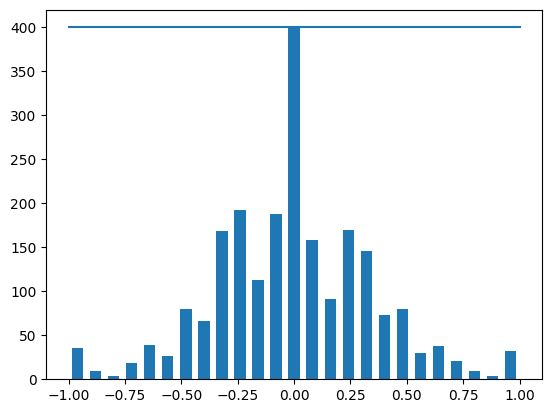

In [5]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [6]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # right image append
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2024_04_08_01_43_08_407.jpg
left        left_2024_04_08_01_43_08_407.jpg  
right       right_2024_04_08_01_43_08_407.jpg 
steering   -0.05                              
throttle    1.0                               
reverse     0.0                               
speed       6.025622                          
Name: 12, dtype: object


In [7]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 5258
Valid Samples: 1315


Text(0.5, 1.0, 'Validation set')

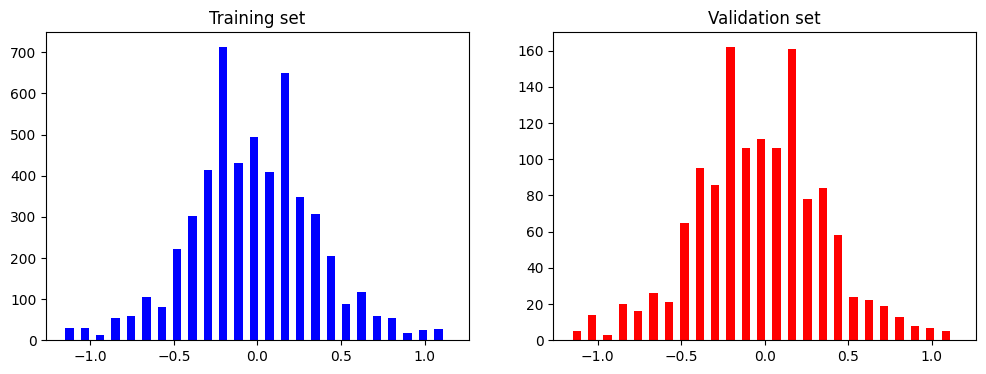

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [9]:
image_paths

array(['.//IMG\\center_2024_04_08_01_43_08_109.jpg',
       './/IMG\\left_2024_04_08_01_43_08_109.jpg',
       './/IMG\\right_2024_04_08_01_43_08_109.jpg', ...,
       './/IMG\\center_2024_04_08_01_54_47_739.jpg',
       './/IMG\\left_2024_04_08_01_54_47_739.jpg',
       './/IMG\\right_2024_04_08_01_54_47_739.jpg'], dtype='<U41')

Text(0.5, 1.0, 'Zoomed Image')

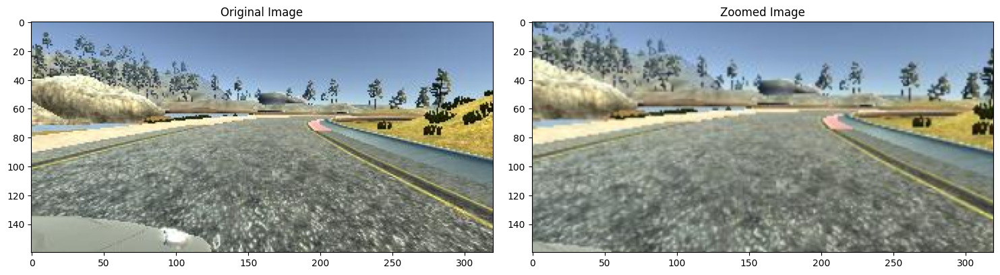

In [10]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

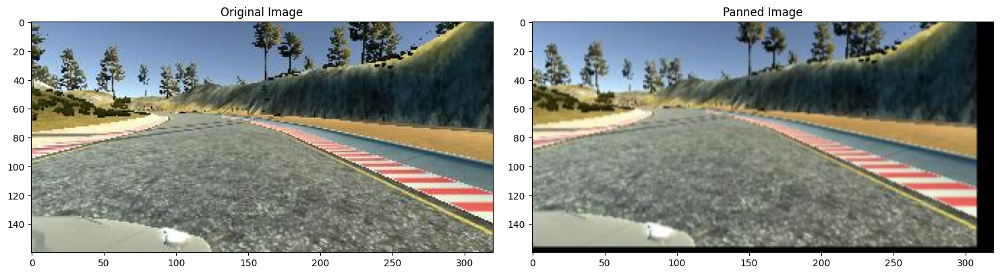

In [11]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

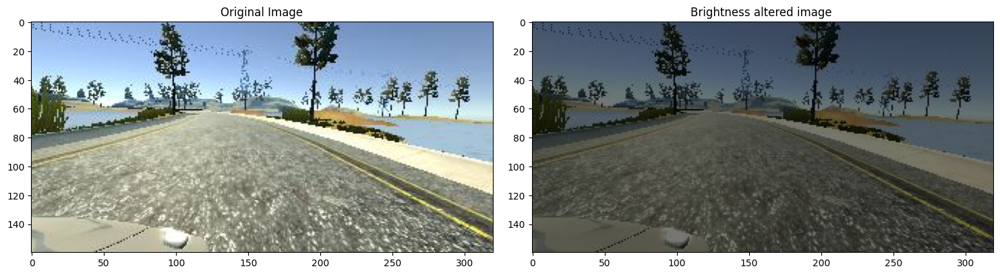

In [12]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.5')

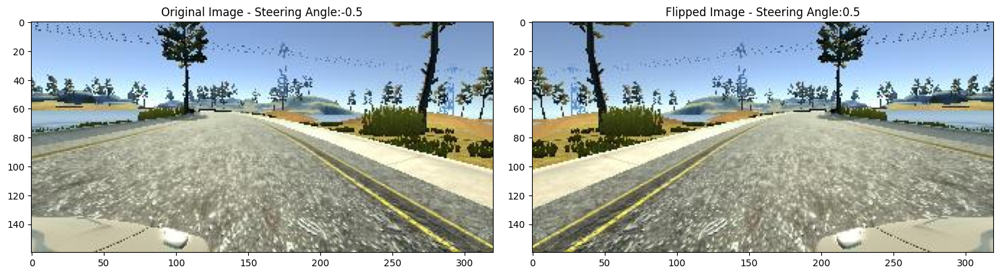

In [13]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

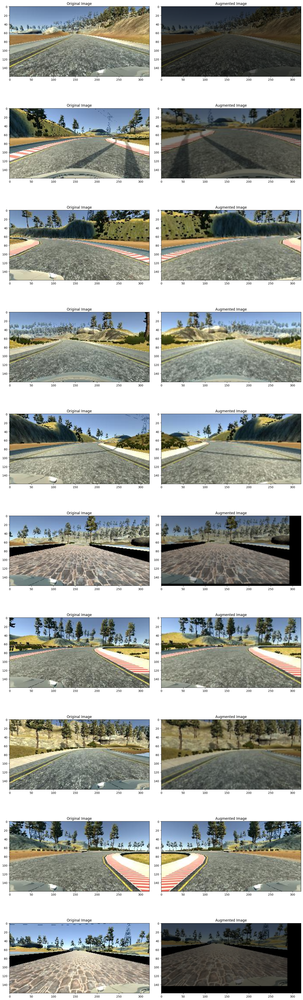

In [14]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

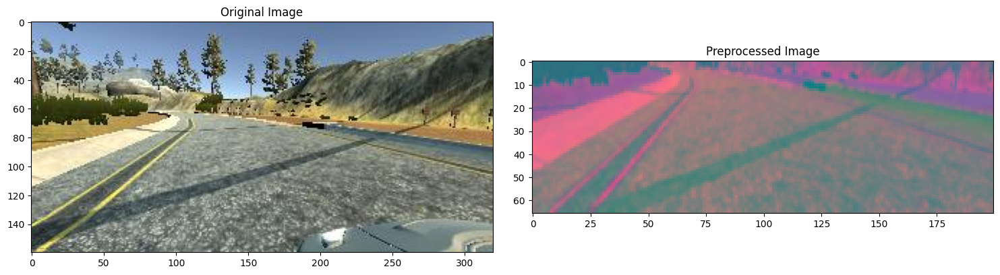

In [15]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [16]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            
            random_index = random.randint(0, len(image_paths) - 1)
           
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]
            
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

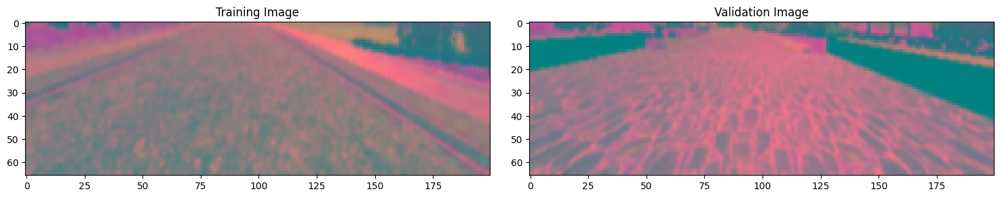

In [17]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [18]:
 def nvidia_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='elu'))

    model.add(tf.keras.layers.Convolution2D(64, 3, 3, activation='elu'))
    # model.add(tf.keras.layers.Dropout(0.5))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(100, activation = 'elu'))
    model.add(tf.keras.layers.Dense(50, activation = 'elu'))
    model.add(tf.keras.layers.Dense(10, activation = 'elu'))
    
    model.add(tf.keras.layers.Dense(1))

    optimizer = tf.keras.optimizers.Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [19]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 31, 98, 24)        1824      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 47, 36)        21636     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 5, 22, 48)         43248     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 20, 64)         27712     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 6, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 384)               0         
_________________________________________________________________
dense (Dense)                (None, 100)               3

C:\Users\Denys\anaconda3\envs\sdc\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [20]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

C:\Users\Denys\anaconda3\envs\sdc\lib\site-packages\tensorflow\python\keras\engine\training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
300/300 [==============================] - 524s 2s/step - loss: 0.1095 - val_loss: 0.0678
Epoch 2/10
300/300 [==============================] - 395s 1s/step - loss: 0.0765 - val_loss: 0.0523
Epoch 3/10
300/300 [==============================] - 441s 1s/step - loss: 0.0670 - val_loss: 0.0571
Epoch 4/10
300/300 [==============================] - 171s 570ms/step - loss: 0.0616 - val_loss: 0.0512
Epoch 5/10
300/300 [==============================] - 150s 499ms/step - loss: 0.0582 - val_loss: 0.0446
Epoch 6/10
300/300 [==============================] - 149s 500ms/step - loss: 0.0574 - val_loss: 0.0485
Epoch 7/10
300/300 [==============================] - 148s 494ms/step - loss: 0.0543 - val_loss: 0.0486
Epoch 8/10
300/300 [==============================] - 148s 494ms/step - loss: 0.0532 - val_loss: 0.0461
Epoch 9/10
300/300 [==============================] - 147s 489ms/step - loss: 0.0523 - val_loss: 0.0437
Epoch 10/10
300/300 [==============================] - 146s 490ms/step - 

Text(0.5, 0, 'Epoch')

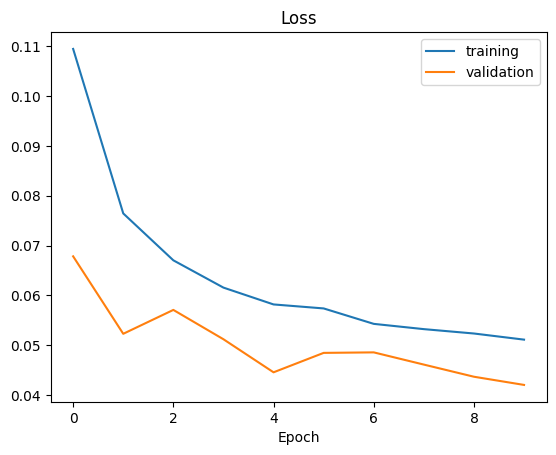

In [21]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [22]:
model.save('model.h5')

In [23]:
model.save('car_model')

INFO:tensorflow:Assets written to: car_model\assets


In [24]:
tf.keras.models.load_model('model.h5')